In this lab, a system similar to [Shazam](http://bit.ly/1fvTDIQ) will be implemented. A complete [acoustic fingerprint](https://en.wikipedia.org/wiki/Acoustic_fingerprint) of a song is generated by hashing the **frequency and time** information in the spectrogram. A fingerprint of a snippet (a brief extract of a song) is later generated and searched through the database of hashes. A high number of matches is found if the snippet comes from the corresponding song. 

This lab has 6 exercises. Make sure to attempt all of them.

# Shazam: Audio Recognition System

### Necessary packages:
- numpy
- matplotlib
- scipy
- hashlib
- IPython

As usual, we set the inline option and import necessary modules. 

In [1]:
import numpy as np 
import pickle
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
from collections import defaultdict
from scipy.ndimage.filters import maximum_filter # find the peaks in the spectrogram
from scipy.ndimage.morphology import (generate_binary_structure,iterate_structure)
from scipy.io.wavfile import read, write #read and write wav files.
import hashlib # to generate hash from the frequency and time information
from IPython.display import Audio
%matplotlib inline

We define a function called readAudioFile to read the **wav** file. *limit* is the number of seconds from the beginning of the song we would like to read. If *limit* is None, readAudioFile returns the data for the whole song. 

In [2]:
def readAudioFile(filename, limit = None):
    ''' Code to read in a file, with limits
        if specified. 
        Args:
            filename: [string] name of file 
            limit: [int] passed if you want to read
                         a limited section of the file
        Returns:
            channels: [list] different channels of the
                             audio file sampled
            rate: [int] rate of sampling of the audio in Hertz
    '''
    rate, data = read(filename)
    if limit:
        limit = limit * rate
    channels = []
    for chn in range(data.shape[1]):
        if limit:
            single = data[:limit, chn]
        else:
            single = data[:, chn]
        channels.append(single)
    return channels, rate

We will implement the Shazam [paper](http://www.ee.columbia.edu/~dpwe/papers/Wang03-shazam.pdf). We will refer to figures in this paper. 

There are three components that we will implement in this lab:

1. **get_2D_peaks**: Find the peaks in the spectrogram. Refer to figure 1B of the paper: The set of peaks of the spectrogram is also called the constellation map. 
2. **generate_hashes**: Generate the hashes from the constellation map. See figure 1C and 1D. The structure of the hashes is [f1:f2:delta_t]:t1. Then we call the hashlib function sha1 to generate a single number for our hash. For this demo, we will keep the first 25 values of the hash. 
3. **match_fingerprint**: the matching function to match the fingerprint to an a hashed audio file

![](shazam_method.png)


## <span style="color:blue"> Exercise 1</span>
- We will develop the code to detect peaks given a 2D array (spectrogram)

In [3]:
struct   = generate_binary_structure(2,1)
neighborhood  = iterate_structure(struct, 20)
    
def get_2D_peaks(arr2D, plot, amp_min=10, neighborhood=neighborhood):
    ''' Function which takes as input a 2D array and outputs 
        the peaks which have amplitude greater than min_amplitude
        in the footprint neighborhood area
        Args:
            arr2D: [ndarray] 2D array of values to find peaks, with rows (axis=0)
                             corresponding to times, and columns to frequencies (axis=1)
            plot: [bool] whether to plot the peaks as a constellation plot
            amp_min: [int] the minimum amplitude of a peak to be returned
            footprint: [struct] neighborhood structure to evaluate the peaks
        Returns:
            tf_idx: [list of 2 lists] contains frequencies and time indices 
        TODO:
            1. Use the maximum_filter() from scipy.ndimage to perform a maximum filtering:
               - this will replace the entire image with blocks of local maxima
               - use the footprint argument as the neighborhood passed as input
            2. Using the output of the maximum_filter(), the peaks can be obtained by
               checking where the returned image equals the original image 
                (i.e., peaks = 1*(orig_image == returned_image))
            3. Once you obtain the peaks image, write your own code 
               - to identify all the peaks from the peak image which have a minimum 
                 amplitude of amp_min, and return a tf_idx list of peak values
               - tf_idx will contain the frequency (or the indices corresponding to axis=1)
                 and times (or the indices corresponding to axis=0)
            4. If the plot bool is positive, also plot the constellation plot of all
               the time-frequency peaks which pass the amplitude thresholding, overlayed
               on the imshow of arr2D.
    '''
    
    frequency_idx = []
    time_idx = []
    
    detected_peaks = maximum_filter(arr2D, footprint = neighborhood)
    peaks = 1*(arr2D == detected_peaks)
    freq = peaks[0]
    time = peaks[1]
    for i in range (peaks.shape[0]):
        for j in range (peaks.shape[1]):
            if (arr2D[i][j]>= amp_min and peaks[i][j]):
                frequency_idx.append(i)
                time_idx.append(j)
                
    
    if plot: 
        fig, ax = plt.subplots()
        ax.imshow(arr2D)
        ax.scatter(time_idx, frequency_idx)
        ax.set_xlabel('Time')
        ax.set_ylabel('Frequency')
        ax.set_title("Spectrogram")
        plt.gca().invert_yaxis()
        plt.axis('tight') 
        
    tf_idx = [frequency_idx, time_idx]
    return tf_idx

## <span style="color:blue"> Exercise 2</span>
- We will now develop the code to generate hashes given the peaks. Note this property of `yield` in python:

At a glance, the `yield` statement is used to define generators, replacing the return of a function to provide a result to its caller without destroying local variables. Unlike a function, where on each call it starts with new set of variables, a generator will resume the execution where it was left off.

In [4]:
def generate_hashes(peaks, fan_value = 10, len_hash = 25):
    ''' This function will hash all the peaks passed to create a hashes
        of length len_hash. The fan_value corresponds to the number of
        indices after the current peak's index that should be included in
        the hashing.
        Args:
            peaks: [list of two lists] as returned from the peak_finding
                   function above, consisting frequency and time indices.
            fan_value: [int] number of later peaks to hash with the 
                       present peak
            len_hash: [int] length of the Hash returned for each peak
        Returns: 
            yield a generator of hash values of len_hash lenght, and time of 
            occurrence
            
        TODO:
            - given two indices i, j get the corresponding frequency values 
              freq1 = freq(i) and freq2 = freq(i+j). Similarly for t1 = time(i)
              and t2 = time(i+j) using the peaks list
            - then, obtain t_delta, the difference t2 - t1
            - if t_delta is non-negative (i.e. >=0), call the sha1 function from hashlib
              to hash the string 'to_hash' using the sha1 algorithm
        Comments:
            - The use of two for loops is not the most ideal
              implementation in Python. But it is okay for yield.
    '''
    
    fingerprinted = set()
    num_peaks = len(peaks[0])
    print('Number of peaks: ', num_peaks)
    freq = peaks[0]
    time = peaks[1]

    for i in range(num_peaks):
        for j in range(fan_value):
            if (i + j) < num_peaks and not (i, i + j) in fingerprinted:
                freq1 = freq[i]
                freq2 = freq[i+j]
                t1 = time[i]
                t2 = time[i+j]
                t_delta = t2-t1
                if t_delta >= 0:
                    # SHA1 algorithm from hashlib
                    to_hash = ("%s|%s|%s" % (str(freq1), str(freq2), str(t_delta))).encode('utf-8')
                    h = hashlib.sha1(to_hash)
                    yield (h.hexdigest()[0:len_hash], t1)
                fingerprinted.add((i, i + j))                    

The following function **fingerpint** returns the hashes of an audio file. To be more precise, it returns a generator for the hashes of the audio file, which can be accessed at run time and need not be stored in variables. You do not need to edit this part. 

In [5]:
def fingerprint(samples, Fs, wsize, wratio, fan_value, amp_min, plot):
    ''' Given samples of the audio file, and the different properties
        for hashing and creating a fingerprint, call the peak finding
        function and generate hashes.
    '''
    arr2D = mlab.specgram(samples, NFFT = wsize, Fs = Fs, window = mlab.window_hanning, noverlap = int(wsize * wratio))[0];
    arr2D = 10 * np.log10(arr2D+0.001)
    arr2D[arr2D == -np.inf] = 0
    local_maxima = get_2D_peaks(arr2D, plot, amp_min = amp_min)
    hashes = generate_hashes(local_maxima, fan_value = fan_value, len_hash = 25)
    return hashes

For easy visualization and explanation, we will convert our hashes into a dictionary of the form: **dict[hash] = t1**. 

Dictionaries consist of pairs of **keys** and their corresponding **values**. We use the hashes as keys and the time of the hash as value. Since different segments from the audio file can produce the same hash, one key might correspond to multiple values (multiple starting times t1). We use the `defaultdict` data structure to accomodate multiple-valued-single-key entries. You do not need to edit the function below.

In [6]:
def hashesToDict(hashesExcerpt):
    ''' Function to convert the hashes obtained into a dictionary
        of the form dict[hash]=time(s)
    '''
    dataExcerpt  = []
    for i in hashesExcerpt:
        dataExcerpt.append(i)
    dictExcerpt = defaultdict(list)
    for hashString, t1 in dataExcerpt:
        dictExcerpt[hashString].append(t1)
    return dictExcerpt

## <span style="color:blue"> Exercise 3</span>
- Write a function called readAudioFileExcerpt with three inputs. See the readAudioFile function above for guidance. The first input is the filename. The other two inputs are lowLimit and highLimit, which is used to read the audio file from lowLimit to highLimit **seconds**. Make sure you convert the limits to digital sampling indices using sampling rate.

In [7]:
def readAudioFileExcerpt(filename, lowLimit, highLimit):
    ''' Code to read in a file, with limits
        Args:
            filename:  [string] name of file 
            lowLimit:  [int] smaller index of section of file to extract
            highLimit: [int] higher index of section of file to extract
        Returns:
            channels:  [list] different channels of the
                             audio file sampled from lowLimit to highLimit indices
            rate:      [int] rate of sampling of the audio in Hertz
        Hint: 
            - lower index will correspond to lowLimit*rate, similarly higher index
    '''
    rate, data = read(filename)
    lowLimit = lowLimit * rate
    highLimit = highLimit * rate
    channels = []
    for chn in range(data.shape[1]): 
        channels.append(data[lowLimit:highLimit, chn])
    return channels, rate

## <span style="color:blue"> Exercise 4</span>
- Complete the function below to match the fingerprint of the excerpt to the original song. Return count and delta_k. Count is the number of matching hashes. delta_k is a list of (the absolute value of) offsets of the database song time and the snippet song time. See section 2.3 of the paper. Read also [this document](http://www.tutorialspoint.com/python/python_dictionary.htm) on how to manipulate the dictionary.

In [8]:
def match_fingerprint(dictExcerpt,dictOriginal):
    ''' Function that matches a given excerpt dictionary
        to the dictionary of the whole song
        Args: 
            dictExcerpt [dict]: dictionary of song segment
            dictOriginal [dict]: dictionary of the entire song
        Returns:
            count [int]: number of matches found for hashes 
                         between the excerpt and the song
            delta_k [list]: time difference values as in paper
        TODO:
            - If the match is found, complete code to store 
              all hash matches (i.e. if hash1 and hash2 match, 
              save absolute values of deltas for all possible
              combinations of times corresponding hash1 and hash2)
            - Also increment the count variable for each time combination
    '''
    count  = 0
    delta_k = []
    for item in dictExcerpt.items():
        hashString = item[0]
        if hashString in dictOriginal: # if we found a match
            for time_i in item[1]:
                for time_j in dictOriginal[hashString]:
                    count = count + 1
                    diff = abs(time_j - time_i)
                    delta_k.append(diff)
                    
    return count, delta_k

### All functions are now defined!

We are now ready to go through the Shazam system.

0. Define window size, overlap ratio between consecutive frames.

In [9]:
wsize  = 4096  # window size
wratio = 0.5  # overlap ratio
fan_value = 10  # number of target points in the frequency domain to pair with the anchor point
amp_min = 45  # minimum amplitude of the peak.
plot = True

1. Read in a sample audio (wav) file. 

In [10]:
all_files = ['data/JonBoden.wav', 'data/BreakingtheHabit.wav', 'data/Gia-Nhu-Anh-Lang-Im.wav',
             'data/Minh_Yeu_Nhau_Di_Bich_Phuong.wav', 'data/WakeMeUp.wav', 'data/YourLove.wav']
input_file = all_files[4]
channels, Fs = readAudioFile(input_file) 
print(Fs)
Audio(input_file)

44100


2. Extract and save the fingerprints.

2
Number of peaks:  333


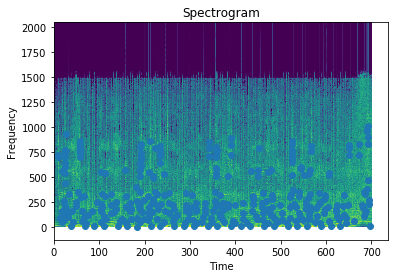

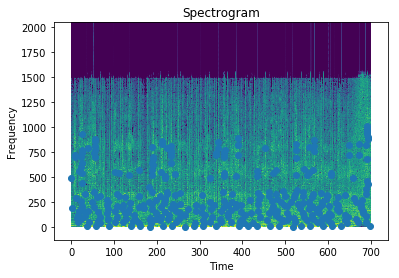

In [11]:
print(len(channels))
for samples in channels:
    hashes = fingerprint(samples, Fs, wsize, wratio, fan_value, amp_min, plot)

# Now we convert the hashes to a dictionary called **dictOriginal**.
# **dictOriginal** contains all the hashes of the song. 
# The key is the hash and the value is the time. See figure 1D in the paper.

dictOriginal = hashesToDict(hashes)
fileHandle  = open("data/fingerprints/song0.fp","wb") #wb: write binary
pickle.dump(dictOriginal, fileHandle)

Now we load the fingerprinted file back and store it as **dictOriginal**. You can fingerprint as many files as you want, then read all of them here. 

In [12]:
fileHandle = open("data/fingerprints/song0.fp","rb")
dictOriginal = pickle.load(fileHandle)

## <span style="color:blue"> Exercise 5 (a)</span>

3. Make use of function(s) you have defined earlier to do the following for the JonBoden.wav and WakeMeUp.wav files:
    - Read a snippet from 40s to 50s of the song
    - Generate the hashes
    - Convert hash to dict
    - Match fingerprint wrt to the entire JonBoden.wav song's fingerprint we have just obtained 
    
  Finally, we will count how many matches are found and plot the histogram of the offsets.
 

Code for matching the first file

Number of peaks:  60


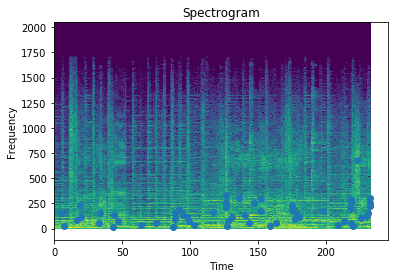

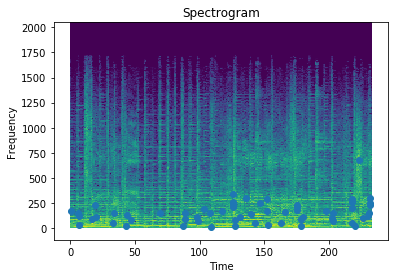

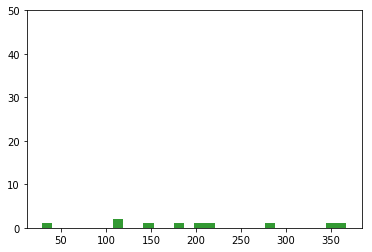

In [13]:
# your code here
channelsExcerpt1, framerate = readAudioFileExcerpt('data/JonBoden.wav', 40,50)
  
for samples in channelsExcerpt1:
    hashesExcerpt1 = fingerprint(samples, framerate, wsize, wratio, fan_value, amp_min, plot)
dictExcerpt1 = hashesToDict(hashesExcerpt1)

count, delta = match_fingerprint(dictExcerpt1, dictOriginal)
if delta:
    fig = plt.figure()
    ax = fig.add_subplot(111)
    numBins = 30
    ax.hist(delta,numBins,color='green',alpha=0.8)
    ax.set_ylim(0, 50)
plt.show()

Number of peaks:  105


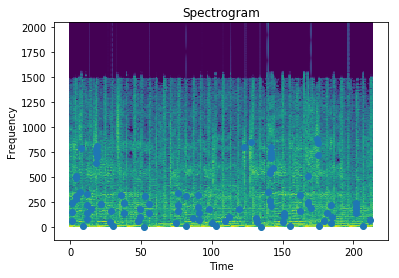

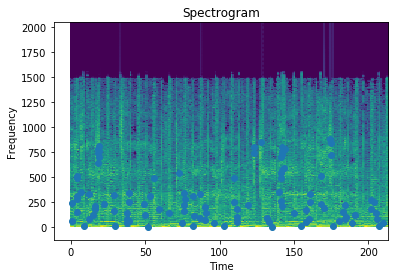

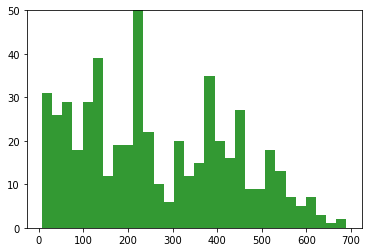

In [14]:
# your code here
channelsExcerpt1, framerate = readAudioFileExcerpt('data/WakeMeUp.wav', 10,20)
  
for samples in channelsExcerpt1:
    hashesExcerpt1 = fingerprint(samples, framerate, wsize, wratio, fan_value, amp_min, plot)
dictExcerpt1 = hashesToDict(hashesExcerpt1)

count, delta = match_fingerprint(dictExcerpt1, dictOriginal)
if delta:
    fig = plt.figure()
    ax = fig.add_subplot(111)
    numBins = 30
    ax.hist(delta,numBins,color='green',alpha=0.8)
    ax.set_ylim(0, 50)
plt.show()

### <span style="color:blue"> Exercise 5 (b)</span>
Based on the number of matches (consider how many possible matches there are) and histogram of offsets, justify that your code produces a desirable result. 

Your answer here:

## <span style="color:blue"> Exercise 6</span>

### Which song is this clip from?
- You are given here a clip (data/test_clip.wav) from one of the 6 songs (refer `all_files`) in the data folder
- Write your own code to 
    - load each song as a hash dictionary
    - fingerprint the given sound clip
    - run matching with all songs
    - plot the resulting histogram of deltas as above
    - identify the **song** and **time(sec)** in the song where the given clip is from. Hint: 
          - identify the delta value with the peak, say k
          - identify the time index corresponding to the k-th window of a sound clip 
          - the time in seconds can then be obtained by dividing by the frame rate
      
- You can verify by listening to the clip and the song!

Number of peaks:  100


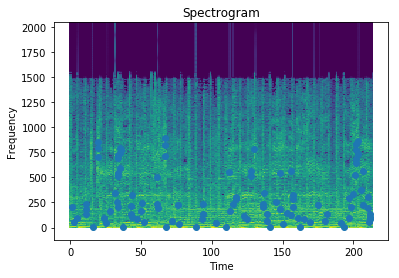

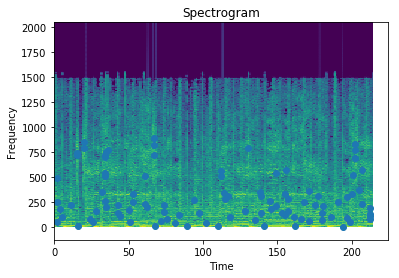

In [15]:
channelsExcerpt2, framerate = readAudioFile('data/test_clip.wav')
for samples in channelsExcerpt2:
    hashesExcerpt2 = fingerprint(samples, framerate, wsize, wratio, fan_value, amp_min, plot)
dictExcerpt2 = hashesToDict(hashesExcerpt2)


Number of peaks:  821


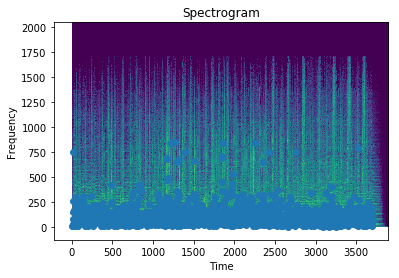

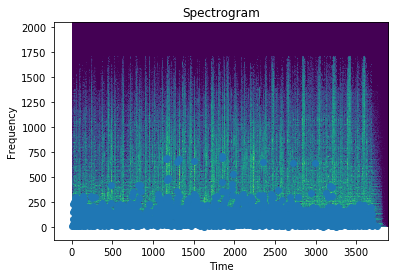

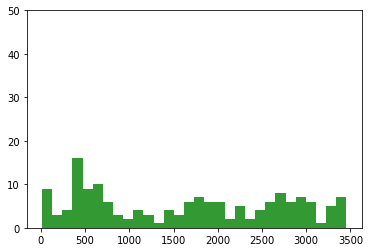

In [16]:
all_files = ['data/JonBoden.wav', 'data/BreakingtheHabit.wav', 'data/Gia-Nhu-Anh-Lang-Im.wav',
             'data/Minh_Yeu_Nhau_Di_Bich_Phuong.wav', 'data/WakeMeUp.wav', 'data/YourLove.wav']
input_file = all_files[0]
channels, Fs = readAudioFile(input_file) 


for samples in channels:
    hashes = fingerprint(samples, Fs, wsize, wratio, fan_value, amp_min, plot)

dictOriginal0 = hashesToDict(hashes)
fileHandle  = open("data/fingerprints/song0.fp","wb") #wb: write binary
pickle.dump(dictOriginal0, fileHandle)
fileHandle = open("data/fingerprints/song0.fp","rb")
dictOriginal0 = pickle.load(fileHandle)


count, delta = match_fingerprint(dictExcerpt2, dictOriginal0)
if delta:
    fig = plt.figure()
    ax = fig.add_subplot(111)
    numBins = 30
    ax.hist(delta,numBins,color='green',alpha=0.8)
    ax.set_ylim(0, 50)
plt.show()

Number of peaks:  1423


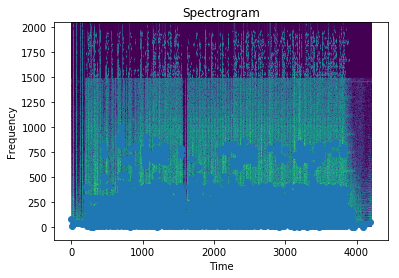

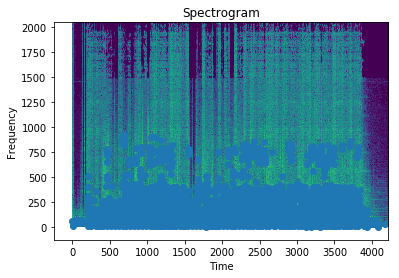

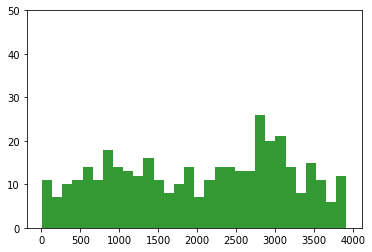

In [17]:
input_file = all_files[1]
channels, Fs = readAudioFile(input_file) 


for samples in channels:
    hashes = fingerprint(samples, Fs, wsize, wratio, fan_value, amp_min, plot)

dictOriginal1 = hashesToDict(hashes)
fileHandle  = open("data/fingerprints/song0.fp","wb") #wb: write binary
pickle.dump(dictOriginal1, fileHandle)
fileHandle = open("data/fingerprints/song0.fp","rb")
dictOriginal1 = pickle.load(fileHandle)


count, delta = match_fingerprint(dictExcerpt2, dictOriginal1)
if delta:
    fig = plt.figure()
    ax = fig.add_subplot(111)
    numBins = 30
    ax.hist(delta,numBins,color='green',alpha=0.8)
    ax.set_ylim(0, 50)
plt.show()

Number of peaks:  820


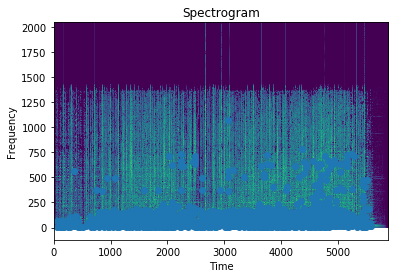

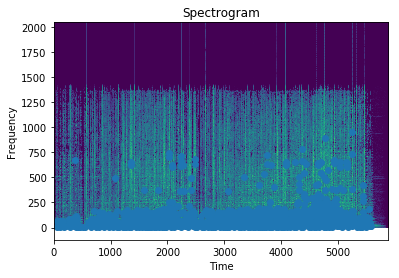

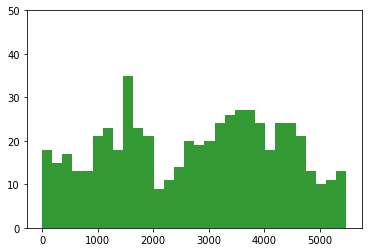

In [18]:
input_file = all_files[2]
channels, Fs = readAudioFile(input_file) 


for samples in channels:
    hashes = fingerprint(samples, Fs, wsize, wratio, fan_value, amp_min, plot)

dictOriginal2 = hashesToDict(hashes)
fileHandle  = open("data/fingerprints/song0.fp","wb") #wb: write binary
pickle.dump(dictOriginal2, fileHandle)
fileHandle = open("data/fingerprints/song0.fp","rb")
dictOriginal2 = pickle.load(fileHandle)


count, delta = match_fingerprint(dictExcerpt2, dictOriginal2)
if delta:
    fig = plt.figure()
    ax = fig.add_subplot(111)
    numBins = 30
    ax.hist(delta,numBins,color='green',alpha=0.8)
    ax.set_ylim(0, 50)
plt.show()

Number of peaks:  1609


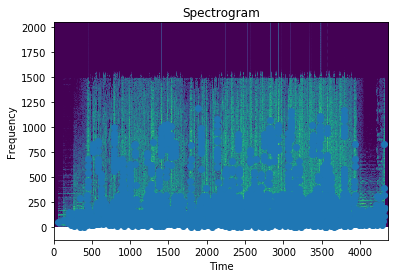

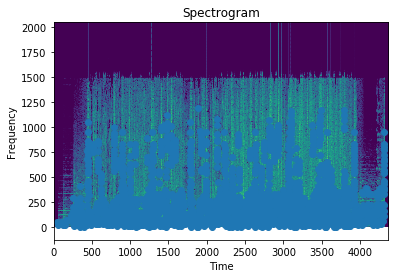

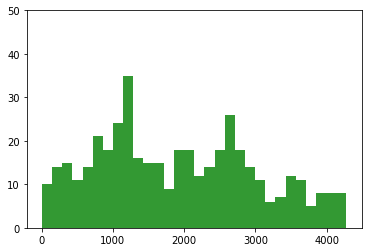

In [19]:
input_file = all_files[3]
channels, Fs = readAudioFile(input_file) 


for samples in channels:
    hashes = fingerprint(samples, Fs, wsize, wratio, fan_value, amp_min, plot)

dictOriginal3 = hashesToDict(hashes)
fileHandle  = open("data/fingerprints/song0.fp","wb") #wb: write binary
pickle.dump(dictOriginal3, fileHandle)
fileHandle = open("data/fingerprints/song0.fp","rb")
dictOriginal3 = pickle.load(fileHandle)


count, delta = match_fingerprint(dictExcerpt2, dictOriginal3)
if delta:
    fig = plt.figure()
    ax = fig.add_subplot(111)
    numBins = 30
    ax.hist(delta,numBins,color='green',alpha=0.8)
    ax.set_ylim(0, 50)
plt.show()

Number of peaks:  333


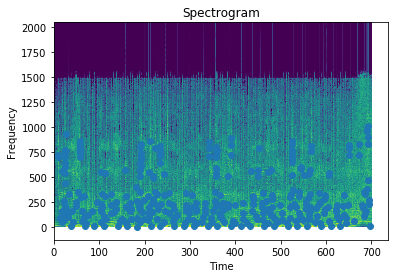

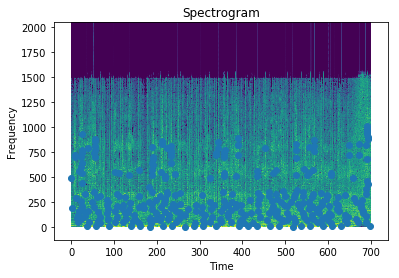

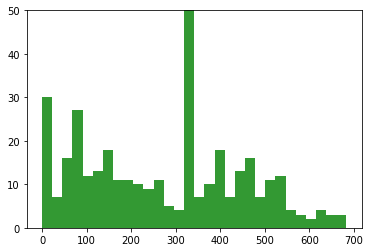

In [20]:
input_file = all_files[4]
channels, Fs = readAudioFile(input_file) 


for samples in channels:
    hashes = fingerprint(samples, Fs, wsize, wratio, fan_value, amp_min, plot)

dictOriginal4 = hashesToDict(hashes)
fileHandle  = open("data/fingerprints/song0.fp","wb") #wb: write binary
pickle.dump(dictOriginal4, fileHandle)
fileHandle = open("data/fingerprints/song0.fp","rb")
dictOriginal4 = pickle.load(fileHandle)


count, delta = match_fingerprint(dictExcerpt2, dictOriginal4)
if delta:
    fig = plt.figure()
    ax = fig.add_subplot(111)
    numBins = 30
    ax.hist(delta,numBins,color='green',alpha=0.8)
    ax.set_ylim(0, 50)
plt.show()


#- identify the delta value with the peak, say k
#- identify the time index corresponding to the k-th window of a sound clip 
#- the time in seconds can then be obtained by dividing by the frame rate

Number of peaks:  171


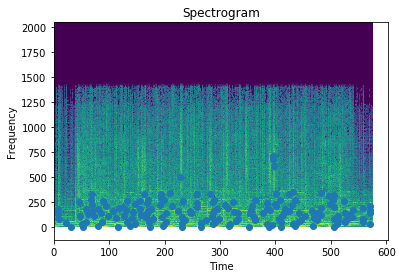

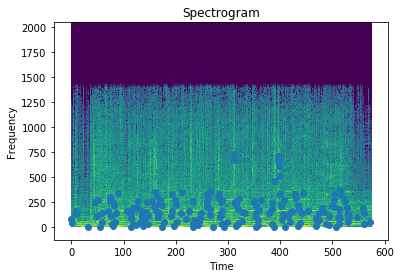

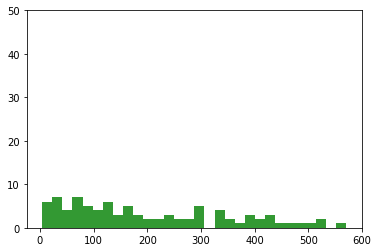

In [21]:
input_file = all_files[5]
channels, Fs = readAudioFile(input_file) 


for samples in channels:
    hashes = fingerprint(samples, Fs, wsize, wratio, fan_value, amp_min, plot)

dictOriginal5 = hashesToDict(hashes)
fileHandle  = open("data/fingerprints/song0.fp","wb") #wb: write binary
pickle.dump(dictOriginal5, fileHandle)
fileHandle = open("data/fingerprints/song0.fp","rb")
dictOriginal5 = pickle.load(fileHandle)


count, delta = match_fingerprint(dictExcerpt2, dictOriginal5)
if delta:
    fig = plt.figure()
    ax = fig.add_subplot(111)
    numBins = 30
    ax.hist(delta,numBins,color='green',alpha=0.8)
    ax.set_ylim(0, 50)
plt.show()

Your answer here: The test_clip matches most with WakeMeUp.wav based on histogram. It matches to 15secs to 24secs of WakeMeUp

**Extra Credit.** 
- Change the length of the hash (len_hash) (try several different values from 10 to 25) and amplitude threshold (amp_min) (try several different values from 5 to 10) and compare the accuracy, speed, and size of the dictionary. What do you think is the optimal trade-off?